In [ ]:
!pip install trimesh
!pip install pymeshlab
!pip install rtree
!pip install shapely
!pip install numpy
!pip install scipy
!pip install open3d
!pip install pyglet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 712.0/712.0 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 541.1/541.1 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 104.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 76.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 63.3 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Atte

In [ ]:
import pymeshlab
import trimesh
import os
import numpy as np
import open3d as o3d
import scipy
import matplotlib.pyplot as plt
import copy
import pyglet

# PyMeshLab

In [ ]:
## Download the required data...
!wget https://github.com/vivekmadhavaram/3DVSS2025/raw/refs/heads/main/meshlab_data.zip

## Extract the files...
!unzip meshlab_data.zip

--2025-06-21 09:06:54--  https://github.com/vivekmadhavaram/3DVSS2025/raw/refs/heads/main/meshlab_data.zip
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/vivekmadhavaram/3DVSS2025/refs/heads/main/meshlab_data.zip [following]
--2025-06-21 09:06:54--  https://raw.githubusercontent.com/vivekmadhavaram/3DVSS2025/refs/heads/main/meshlab_data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14411054 (14M) [application/zip]
Saving to: ‘meshlab_data.zip’

meshlab_data.zip    100%[===================>]  13.74M  29.9MB/s    in 0.5s    

2025-06-21 09:06:56 (29.9 MB/s) - ‘meshlab_data.zip’ saved [144

In [ ]:
#### Trimesh based visualizer (Similar to Vivek, Sriteja trimesh introduction)

def visualizer(root, mesh_name):

    if 'list' in str(type(mesh_name)):
        scene = trimesh.scene.Scene()
        for name in mesh_name:
            mesh_path = os.path.join(root,name)
            mesh = trimesh.load(mesh_path, process=False)
            scene.add_geometry(mesh)
        return scene

    mesh_path = os.path.join(root,mesh_name)
    mesh = trimesh.load(mesh_path, process=False)
    scene = trimesh.scene.Scene()
    scene.add_geometry(mesh)
    return scene

In [ ]:
## Set directory Paths...

src = '/content/meshlab_data' + '/'
dest = '/content/meshlab_data/out' + '/'
os.makedirs(dest, exist_ok=True)

In [ ]:
## Initialize MeshSet() object. Similar to the project section from MeshLab gui
ms = pymeshlab.MeshSet()

### Loading and Saving of 3D Mesh Models

In [ ]:
## loading the mesh

ms.load_new_mesh(os.path.join(src, 'bunny/mesh/bunny_no_texture.obj'))

In [ ]:
## Saving the mesh

ms.save_current_mesh(os.path.join(dest, 'bunny.obj'))

In [ ]:
#visualize
scene = visualizer(dest,'bunny.obj')
scene.show()

In [ ]:
mesh = ms.current_mesh()

# Now get vertex and face counts from the mesh
print("Number of vertices:", mesh.vertex_number())
print("Number of faces:", mesh.face_number())
print("Number of vertex normals:",mesh.vertex_normal_matrix().shape[0])
print("Number of face normals:",mesh.face_normal_matrix().shape[0])
print("Number of vertex colors:",mesh.vertex_color_matrix().shape[0])

Number of vertices: 15258
Number of faces: 30338
Number of vertex normals: 15258
Number of face normals: 30338
Number of vertex colors: 15258


### Applying a filters to the mesh

[*List of filters*](https://pymeshlab.readthedocs.io/en/latest/filter_list.html)

In [ ]:
ms.meshing_decimation_quadric_edge_collapse(targetfacenum=200)
ms.save_current_mesh(os.path.join(dest, 'bunny_decim.obj'))
mesh = ms.current_mesh()
print("Number of faces:", mesh.face_number())

#visualize
scene = visualizer(dest,'bunny_decim.obj')
scene.show()

Number of faces: 199


In [ ]:
ms.load_new_mesh(os.path.join(src, 'bunny/mesh/bunny_no_texture.obj'))
ms.meshing_surface_subdivision_loop()
ms.save_current_mesh(os.path.join(dest, 'bunny_subdiv.obj'))
mesh = ms.current_mesh()
print("Number of faces:", mesh.face_number())

#visualize
scene = visualizer(dest,'bunny_subdiv.obj')
scene.show()

In [ ]:
## Clear the MeshSet.
ms.clear()

In [ ]:
##Coloring the meshs.

ms.load_new_mesh(os.path.join(src, 'bunny/mesh/bunny_no_texture.obj'))
color = pymeshlab.Color(200,0,0)
ms.set_color_per_vertex(color1=color)
ms.save_current_mesh(os.path.join(dest, 'bunny_vc.obj'))
ms.clear()

#visualize
scene = visualizer(dest,'bunny_vc.obj')
scene.show()

In [ ]:
ms.load_new_mesh(os.path.join(src, 'bunny/mesh/bunny_no_texture.obj'))
ms.compute_color_random_per_face()
ms.save_current_mesh(os.path.join(dest, 'bunny_random.obj'))

#visualize
scene = visualizer(dest,'bunny_random.obj')
scene.show()

In [ ]:
## Selection of Meshes depending on the conditions

condition = 'fb<150'
ms.compute_selection_by_condition_per_face(condselect=condition)
ms.meshing_remove_selected_vertices_and_faces()
ms.save_current_mesh(os.path.join(dest, 'bunny_final.obj'))
ms.clear()

#visualize
scene = visualizer(dest,'bunny_final.obj')
scene.show()

### Handling Multiple Meshes

In [ ]:
mesh_1 = 'bunny_multiple/half.obj'
mesh_2 = 'bunny_multiple/full.obj'

In [ ]:
scene = visualizer(src,mesh_1)
scene.show()

In [ ]:
scene = visualizer(src,mesh_2)
scene.show()

In [ ]:
#color Transfer

ms.load_new_mesh(os.path.join(src,mesh_1))
source_id = ms.current_mesh_id()

print("Source Id", source_id)

ms.load_new_mesh(os.path.join(src,mesh_2))
target_id = ms.current_mesh_id()

print("Target Id", target_id)

Source Id 0
Target Id 1


In [ ]:
ms.set_current_mesh(new_curr_id=source_id)


color = pymeshlab.Color(200,100,100)
ms.set_color_per_vertex(color1=color)


ms.save_current_mesh(os.path.join(dest, 'bunny_color_temp.obj'))

#visualize
scene = visualizer(dest,'bunny_color_temp.obj')
scene.show()

In [ ]:
# vertex attribute transfer
ms.transfer_attributes_per_vertex(sourcemesh=source_id,
                                  targetmesh=target_id, colortransfer=True)

ms.set_current_mesh(new_curr_id=target_id)

# save the current mesh
ms.save_current_mesh(os.path.join(dest, 'bunny_color_transfer.obj'))

ms.clear()

In [ ]:
#visualize
scene = visualizer(dest,'bunny_color_transfer.obj')
scene.show()

## Mesh to Point Cloud

In [ ]:
ms.load_new_mesh(os.path.join(src,mesh_2))
ms.meshing_remove_all_faces()
color = pymeshlab.Color(200,100,100)
ms.set_color_per_vertex(color1=color)
ms.save_current_mesh(os.path.join(dest, 'bunny_pcd.obj'))
scene = visualizer(dest,'bunny_pcd.obj')
scene.show()

# Open3D


In [ ]:
mesh = o3d.io.read_triangle_mesh(os.path.join(src, 'bunny/mesh/bunny_no_texture.obj'))
mesh.paint_uniform_color([1,0,0])

save_name = '/content/meshlab_data/out/bunny_colored.obj'
o3d.io.write_triangle_mesh(os.path.join(dest, save_name), mesh)
print(len(np.asarray(mesh.vertices)))

15258


### Mesh To Voxel grid

In [ ]:
mesh = o3d.io.read_triangle_mesh(os.path.join(dest, save_name))
mesh.compute_vertex_normals()

# Convert to voxel grid
mesh.scale(1 / np.max(mesh.get_max_bound() - mesh.get_min_bound()),
           center=mesh.get_center())
voxel_grid = o3d.geometry.VoxelGrid.create_from_triangle_mesh(mesh,
                                                              voxel_size=0.05)
o3d.io.write_voxel_grid(os.path.join(dest, 'bunny_grid.ply'), voxel_grid)
scene = visualizer(dest,['bunny_grid.ply'])
scene.show()


### Translation

In [ ]:
mesh = o3d.io.read_triangle_mesh(os.path.join(dest, save_name))
mesh.translate([100.0,0.0,-200.0])
mesh.paint_uniform_color([0,1,0])
o3d.io.write_triangle_mesh(os.path.join(dest, 'bunny_transl.ply'), mesh)
scene = visualizer(dest,['bunny_colored.obj','bunny_transl.ply'])
scene.show()

### Rotation

In [ ]:
mesh = o3d.io.read_triangle_mesh(os.path.join(dest, save_name))
R = mesh.get_rotation_matrix_from_xyz((np.pi / 2, 0, 0))  # Rotate 90° about X
mesh.rotate(R, center=(0, 0, 0))
mesh.paint_uniform_color([0,1,0])
o3d.io.write_triangle_mesh(os.path.join(dest, 'bunny_rot.ply'), mesh)
scene = visualizer(dest,['bunny_colored.obj','bunny_rot.ply'])
scene.show()

### Dataset

In [ ]:
dataset = o3d.data.ArmadilloMesh()
mesh = o3d.io.read_triangle_mesh(dataset.path)
o3d.io.write_triangle_mesh(os.path.join(dest, 'armadillo.ply'), mesh)
scene = visualizer(dest,['armadillo.ply'])
scene.show()

### Scaling

In [ ]:
mesh = o3d.io.read_triangle_mesh(os.path.join(dest, 'armadillo.ply'))
mesh.scale(0.75, center=mesh.get_center())
mesh.paint_uniform_color([1,0,0])
o3d.io.write_triangle_mesh(os.path.join(dest, 'armadillo_scaled.ply'), mesh)
scene = visualizer(dest,['armadillo.ply','armadillo_scaled.ply'])
scene.show()

In [ ]:
mesh = o3d.io.read_triangle_mesh(os.path.join(dest, 'armadillo_scaled.ply'))
mesh.translate([120.0,0.0,0.0])
mesh.paint_uniform_color([1,0,0])
o3d.io.write_triangle_mesh(os.path.join(dest, 'armadillo_tra.ply'), mesh)
scene = visualizer(dest,['armadillo.ply','armadillo_tra.ply'])
scene.show()

### Different order of transformations

In [ ]:
mesh = o3d.io.read_triangle_mesh(os.path.join(dest, 'armadillo.ply'))
R = mesh.get_rotation_matrix_from_xyz((np.pi / 3, 0, np.pi/4))
mesh.rotate(R, center=(0, 0, 0))
mesh.paint_uniform_color([1,0,0])
o3d.io.write_triangle_mesh(os.path.join(dest, 'armadillo_rot.ply'), mesh)
scene = visualizer(dest,['armadillo.ply','armadillo_rot.ply'])
scene.show()

In [ ]:
mesh = o3d.io.read_triangle_mesh(os.path.join(dest, 'armadillo_rot.ply'))
mesh.translate([80.0,-50.0,150.0])
mesh.paint_uniform_color([0,1,0])
o3d.io.write_triangle_mesh(os.path.join(dest, 'armadillo_trans.ply'), mesh)
scene = visualizer(dest,['armadillo.ply','armadillo_rot.ply','armadillo_trans.ply'])
scene.show()

### Sample points from 3D mesh

In [ ]:
dataset = o3d.data.ArmadilloMesh()
mesh = o3d.io.read_triangle_mesh(dataset.path)
pcd = mesh.sample_points_uniformly(number_of_points=5000)
pcd.paint_uniform_color([1,0,0])
o3d.io.write_point_cloud(os.path.join(dest, 'armadillo_sample.ply'), pcd)
scene = visualizer(dest,['armadillo.ply','armadillo_sample.ply'])
scene.show()

In [ ]:
pcd = o3d.io.read_point_cloud(os.path.join(dest, 'armadillo_sample.ply'))
pcd.translate([120.0,0.0,0.0])
pcd.paint_uniform_color([1,0,0])
o3d.io.write_point_cloud(os.path.join(dest, 'armadillo_sample_trans.ply'), pcd)
scene = visualizer(dest,['armadillo.ply','armadillo_sample.ply','armadillo_sample_trans.ply'])
scene.show()

## Working with RGB-D data

In [ ]:
redwood_rgbd = o3d.data.SampleRedwoodRGBDImages()
color_raw = o3d.io.read_image(redwood_rgbd.color_paths[0])
depth_raw = o3d.io.read_image(redwood_rgbd.depth_paths[0])

# create RGBD image ( 3 + 1 = 4 channels )
rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(color_raw, depth_raw, convert_rgb_to_intensity=False)

print("Color info : ",rgbd.color)
print()
print("Depth info : ",rgbd.depth)

[Open3D INFO] Downloading https://github.com/isl-org/open3d_downloads/releases/download/20220301-data/SampleRedwoodRGBDImages.zip
[Open3D INFO] Downloaded to /root/open3d_data/download/SampleRedwoodRGBDImages/SampleRedwoodRGBDImages.zip
[Open3D INFO] Created directory /root/open3d_data/extract/SampleRedwoodRGBDImages.
[Open3D INFO] Extracting /root/open3d_data/download/SampleRedwoodRGBDImages/SampleRedwoodRGBDImages.zip.
[Open3D INFO] Extracted to /root/open3d_data/extract/SampleRedwoodRGBDImages.
Color info :  Image of size 640x480, with 3 channels.
Use numpy.asarray to access buffer data.

Depth info :  Image of size 640x480, with 1 channels.
Use numpy.asarray to access buffer data.


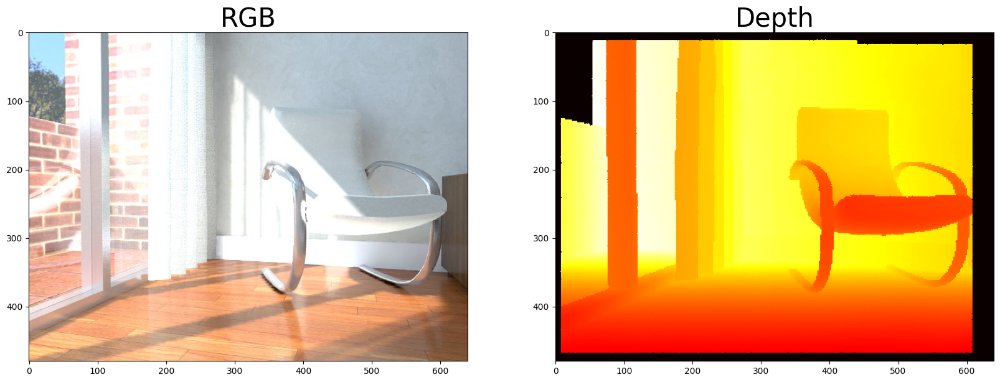

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2)
fig.set_size_inches(20,40)
ax[0].imshow(rgbd.color)
ax[0].set_title('RGB',size=30)
ax[1].imshow(rgbd.depth,cmap='hot')
ax[1].set_title('Depth',size=30)
plt.show()

## Point Cloud from RGBD

In [ ]:
cam_intrinsics =  o3d.camera.PinholeCameraIntrinsic(
        o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault)

cam_intrinsics.intrinsic_matrix

array([[525. ,   0. , 319.5],
       [  0. , 525. , 239.5],
       [  0. ,   0. ,   1. ]])

In [ ]:
pcd = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, cam_intrinsics)

# Flip it, otherwise the pointcloud will be upside down
pcd.transform([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]])

# write point cloud
save_name = 'pcd_from_rgbd.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name), pcd)

# visualize
scene = visualizer(dest, [save_name])
scene.show()

# Point Cloud Registration

In [ ]:
# Camera intrinsics
cam_intrinsics =  o3d.camera.PinholeCameraIntrinsic(
        o3d.camera.PinholeCameraIntrinsicParameters.PrimeSenseDefault)

# data loading (source)
redwood_rgbd = o3d.data.SampleRedwoodRGBDImages()
color_raw = o3d.io.read_image(redwood_rgbd.color_paths[1])
depth_raw = o3d.io.read_image(redwood_rgbd.depth_paths[1])
# create RGBD image ( 3 + 1 = 4 channels )
rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(color_raw, depth_raw, convert_rgb_to_intensity=False)
# point cloud from RGBD
pcd_source = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, cam_intrinsics)

# data loading (target)
redwood_rgbd = o3d.data.SampleRedwoodRGBDImages()
color_raw = o3d.io.read_image(redwood_rgbd.color_paths[4])
depth_raw = o3d.io.read_image(redwood_rgbd.depth_paths[4])
# create RGBD image ( 3 + 1 = 4 channels )
rgbd = o3d.geometry.RGBDImage.create_from_color_and_depth(color_raw, depth_raw, convert_rgb_to_intensity=False)
# point cloud from RGBD
pcd_target = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd, cam_intrinsics)

In [ ]:
save_name_source = 'pcd_source.ply'
save_name_target = 'pcd_target.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name_source), pcd_source)
o3d.io.write_point_cloud(os.path.join(dest, save_name_target), pcd_target)

# visualize
scene = visualizer(dest, [save_name_source, save_name_target])
scene.show()

In [ ]:
pcd_source_temp = copy.deepcopy(pcd_source)
pcd_target_temp = copy.deepcopy(pcd_target)

pcd_source_temp.paint_uniform_color([1.0, 0.8, 0.4]) # --> Blue
pcd_target_temp.paint_uniform_color([0.4,0.8,1.0]) # --> Orange

# write point clouds
save_name_source_temp = 'pcd_source_temp.ply'
save_name_target_temp = 'pcd_target_temp.ply'
o3d.io.write_point_cloud(os.path.join(dest, save_name_source_temp), pcd_source_temp)
o3d.io.write_point_cloud(os.path.join(dest, save_name_target_temp), pcd_target_temp)

# visualize
scene = visualizer(dest, [save_name_source_temp, save_name_target_temp])
scene.show()

In [ ]:
def draw_registration_result(source, target, transformation):
    source.transform(transformation)
    o3d.io.write_point_cloud(os.path.join(dest, 'source_final.ply'), source)
    o3d.io.write_point_cloud(os.path.join(dest, 'target_final.ply'), target)
    o3d.visualization.draw_plotly([source, target])

In [ ]:
demo_icp_pcds = o3d.data.DemoICPPointClouds()
source = o3d.io.read_point_cloud(demo_icp_pcds.paths[0])
target = o3d.io.read_point_cloud(demo_icp_pcds.paths[1])
source.paint_uniform_color([1, 0.706, 0])
target.paint_uniform_color([0, 0.651, 0.929])
o3d.io.write_point_cloud(os.path.join(dest, 'source.ply'), source)
o3d.io.write_point_cloud(os.path.join(dest, 'target.ply'), target)
scene = visualizer(dest, ['source.ply','target.ply'])
scene.show()

In [ ]:
threshold = 0.02
trans_init = np.asarray([[0.862, 0.011, -0.507, 0.5],
                         [-0.139, 0.967, -0.215, 0.7],
                         [0.487, 0.255, 0.835, -1.4], [0.0, 0.0, 0.0, 1.0]])
reg_p2p = o3d.pipelines.registration.registration_icp(
    source, target, threshold, trans_init,
    o3d.pipelines.registration.TransformationEstimationPointToPoint(),
    o3d.pipelines.registration.ICPConvergenceCriteria(max_iteration=2000))
print(reg_p2p)
print("Transformation is:")
print(reg_p2p.transformation)

RegistrationResult with fitness=6.211230e-01, inlier_rmse=6.583448e-03, and correspondence_set size of 123501
Access transformation to get result.
Transformation is:
[[ 0.84024592  0.00687676 -0.54241281  0.6463702 ]
 [-0.14819104  0.96517833 -0.21706206  0.81180074]
 [ 0.52111439  0.26195134  0.81189372 -1.48346821]
 [ 0.          0.          0.          1.        ]]


In [ ]:
draw_registration_result(source, target, reg_p2p.transformation)

# CAD Models

In [ ]:
!pip install -q condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/jaimergp/miniforge/releases/download/24.11.2-1_colab/Miniforge3-colab-24.11.2-1_colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:13
🔁 Restarting kernel...


In [ ]:
!conda create -y -n myoccwlenv python=3.7
!conda install -y -n myoccwlenv -c lambouj -c conda-forge occwl

Streaming output truncated to the last 5000 lines.
                                                                        

















                                                                        










Preparing transaction: - \ | done
Verifying transaction: - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / done
Executing transaction: \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ done
#
# To activate this environment, use
#
#     $ conda activate myoccwlenv
#
# To deactivate an active environment, use
#
#     $ conda deactivate

Channels:
 - lambouj
 - conda-forge
Platform: linux-64
Solving environment: \ | / - \ | / - \ done


==> WARNING: A newer version of conda exists. <==
    current version: 24.11.2
    latest version: 25.5.1

Please update conda by running

    $ conda upd

In [ ]:
!conda run -n myoccwlenv python -c "from occwl.solid import Solid; from occwl.io import save_step; box = Solid.make_box(10, 10, 10);print('Box created with', box.num_faces(), 'faces'); save_step([box], 'box_model.step')"


*******************************************************************
******        Statistics on Transfer (Write)                 ******

*******************************************************************
******        Transfer Mode = 0  I.E.  As Is       ******
******        Transferring Shape, ShapeType = 2                      ******
** WorkSession : Sending all data
 Step File Name : box_model.step(380 ents)  Write  Done
Box created with 6 faces



In [ ]:
!conda run -n myoccwlenv python -c "from occwl.solid import Solid; from occwl.io import save_step; box = Solid.make_box(10, 10, 10); sphere = Solid.make_sphere(15,(20,20,20)); print('Sphere created with', sphere.num_faces(), 'faces'); save_step([box,sphere], 'group_model.step')"


*******************************************************************
******        Statistics on Transfer (Write)                 ******

*******************************************************************
******        Transfer Mode = 0  I.E.  As Is       ******
******        Transferring Shape, ShapeType = 2                      ******

*******************************************************************
******        Statistics on Transfer (Write)                 ******

*******************************************************************
******        Transfer Mode = 0  I.E.  As Is       ******
******        Transferring Shape, ShapeType = 2                      ******
** WorkSession : Sending all data
 Step File Name : group_model.step(417 ents)  Write  Done
Sphere created with 1 faces

